<a href="https://colab.research.google.com/github/Jeremy26/tracking_course/blob/master/YOLO_v4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Welcome to the YOLO Workshop!

In this workshop, we will learn how to use the YOLO algorithm for object detection

## Import the YOLO files and the images

In [1]:
!wget https://thinkautonomous-tracking.s3.eu-west-3.amazonaws.com/tracking.zip && unzip tracking.zip

--2022-02-24 17:18:57--  https://thinkautonomous-tracking.s3.eu-west-3.amazonaws.com/tracking.zip
Resolving thinkautonomous-tracking.s3.eu-west-3.amazonaws.com (thinkautonomous-tracking.s3.eu-west-3.amazonaws.com)... 52.95.156.20
Connecting to thinkautonomous-tracking.s3.eu-west-3.amazonaws.com (thinkautonomous-tracking.s3.eu-west-3.amazonaws.com)|52.95.156.20|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824310377 (786M) [application/zip]
Saving to: ‘tracking.zip’

tracking.zip        100%[===================>] 786.12M  31.5MB/s    in 26s     

2022-02-24 17:19:24 (30.4 MB/s) - ‘tracking.zip’ saved [824310377/824310377]



In [3]:
!python3 -m pip install yolov4==2.0.2 # After Checking, YOLO 2.0.2 works without modifying anything. Otherwise keep 1.2.1

  Created wheel for yolov4: filename=yolov4-2.0.2-py3-none-any.whl size=39757 sha256=c594ef475101136d44d2eb27cc8cc5371a98adb837d2dd021a66c2e8e359c7d9
  Stored in directory: /root/.cache/pip/wheels/a6/ef/cb/2a9464b7d9903f97dc6ff06efc72e5b793e07116adca7e8907
Successfully built yolov4


In [4]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

## Read an Image

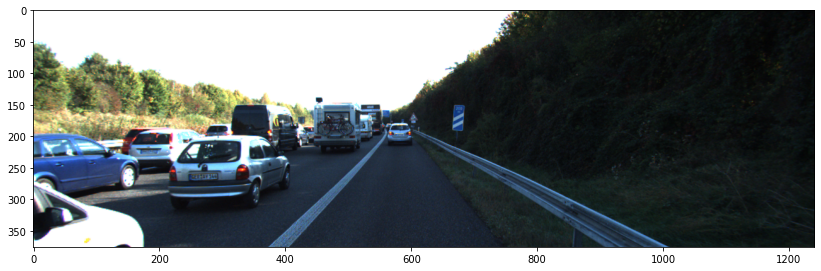

In [53]:
img = cv2.imread("data/0000000230.png")
plt.figure(figsize=(14,7))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

## Build a Basic YOLO Model

In [10]:
from yolov4.tf import YOLOv4
import tensorflow as tf
import time

yolo = YOLOv4(tiny=False)
yolo.classes = "Yolov4/coco.names"
yolo.make_model()
yolo.load_weights("Yolov4/yolov4.weights", weights_type="yolo")

Call tf.config.experimental.set_memory_growth(GPU0, True)


## Detect Objects in 21 Lines

In [65]:
def run_obstacle_detection(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    resized_image = yolo.resize_image(img)
    resized_image = resized_image / 255. # 0 ~ 255 to 0.0 ~ 1.0
    input_data = resized_image[np.newaxis, ...].astype(np.float32)
    candidates = yolo.model.predict(input_data)
    _candidates = []
    result = img.copy()
    for candidate in candidates:
        batch_size = candidate.shape[0]
        grid_size = candidate.shape[1]
        _candidates.append(tf.reshape(candidate, shape=(1, grid_size * grid_size * 3, -1)))
        candidates = np.concatenate(_candidates, axis=1)
        pred_bboxes = yolo.candidates_to_pred_bboxes(candidates[0], iou_threshold=0.35, score_threshold=0.50)
        pred_bboxes = pred_bboxes[~(pred_bboxes==0).all(1)] #https://stackoverflow.com/questions/35673095/python-how-to-eliminate-all-the-zero-rows-from-a-matrix-in-numpy?lq=1
        pred_bboxes = yolo.fit_pred_bboxes_to_original(pred_bboxes, img.shape)
        result = yolo.draw_bboxes(img, pred_bboxes)
    return result, pred_bboxes

time: 313.02 ms
0.3160545825958252


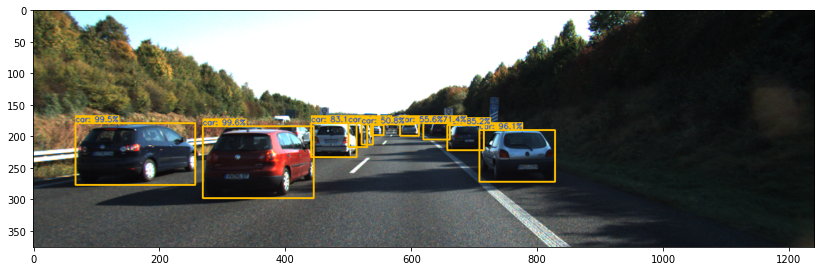

In [64]:
start_time = time.time()
result, pred_bboxes = run_obstacle_detection(img)
print(time.time() - start_time)
plt.figure(figsize=(14,7))
plt.imshow(result)
plt.show() 

## Analyze the Boxes

In [56]:
print(len(pred_bboxes))
print(pred_bboxes)

8
[[0.25042281 0.68397302 0.1575316  0.33179959 2.         0.99559271]
 [0.06742318 0.6519978  0.13407847 0.2894091  2.         0.97289568]
 [0.46866542 0.52169171 0.03267742 0.09535469 2.         0.95860809]
 [0.16783272 0.59679678 0.10074006 0.2048339  2.         0.84975392]
 [0.07116244 0.86740445 0.14166754 0.3738073  2.         0.80694628]
 [0.42496109 0.5102062  0.01626652 0.09503199 2.         0.71382487]
 [0.32492921 0.52375046 0.03764984 0.1550994  2.         0.55637199]
 [0.39099908 0.49591919 0.06148467 0.21361091 7.         0.80458707]]


In [57]:
classesFile = "Yolov4/coco.names"
with open(classesFile,'rt') as f:
    classes = f.read().rstrip('\n').split('\n')

In [58]:
h, w, _ = img.shape
idx = 4

testing_box = pred_bboxes[idx]
print("original box", testing_box)
print("center_x:",testing_box[0]*w)
print("center_y",testing_box[1]*h)
print("width:", testing_box[2]*w)
print("height:",testing_box[3]*h)
print("class:", classes[int(testing_box[4])])
print("confidence:", testing_box[5])

original box [0.07116244 0.86740445 0.14166754 0.3738073  2.         0.80694628]
center_x: 88.3125878944993
center_y 326.14407497644424
width: 175.80942314863205
height: 140.55154662579298
class: car
confidence: 0.8069462776184082


## Draw the Boxes again for Tracking

We're not exactly done. The point of the course isn't to draw these rectangles, but to draw rectangles with specific IDs.

For that, we'll need to assign a color per bounding box, and redraw the boxes.

In [31]:
def xywh_to_ltrb(center_x, center_y, width, height):
    """
    Optional
    """
    left = int(center_x - width/2)
    right = int(center_x + width/2)
    top = int(center_y - width/2)
    bottom = int(center_y + width/2)
    return left, top, right, bottom

In [59]:
def draw_boxes(pred_bboxes, image):
    h, w, _ = image.shape
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for box in pred_bboxes:
        left = int(box[0]*w - box[2]*w /2)
        top = int(box[1]*h - box[3]*h /2)
        right = int(box[0]*w + box[2]*w/2)
        bottom = int(box[1]*h + box[3]*h/2)
        label = classes[int(box[4])]
        cv2.rectangle(image, (left, top), (right, bottom), (255, 79, 23), thickness=11)
        cv2.putText(image, label, (left, top), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=3)
    return image

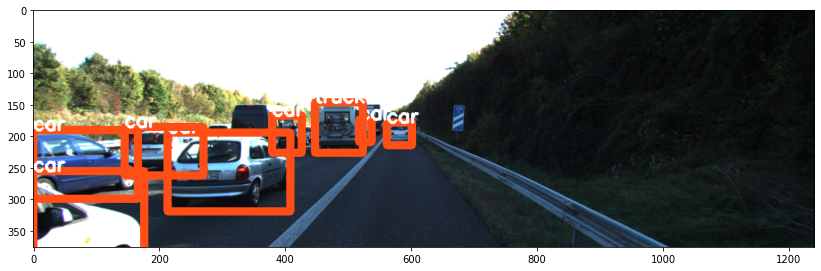

In [60]:
plt.figure(figsize=(14,7))
plt.imshow(draw_boxes(pred_bboxes, img))
plt.show()

## Reach Our Limit — Draw Boxes with a Random Index

In [61]:
def id_to_color(idx):
    """
    Random function to convert an id to a color
    Do what you want here but keep numbers below 255
    """
    blue = idx*5 % 256
    green = idx*36 %256
    red = idx*23 %256
    return (red, green, blue)

def draw_boxes_random(pred_bboxes, image):
    h, w, _ = image.shape
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for i, box in enumerate(pred_bboxes):
        left = int(box[0]*w - box[2]*w /2)
        top = int(box[1]*h - box[3]*h /2)
        right = int(box[0]*w + box[2]*w/2)
        bottom = int(box[1]*h + box[3]*h/2)
        label = classes[int(box[4])]
        cv2.rectangle(image, (left, top), (right, bottom), id_to_color(i*10), thickness=11)
        cv2.putText(image, label, (left, top), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=3)
    return image

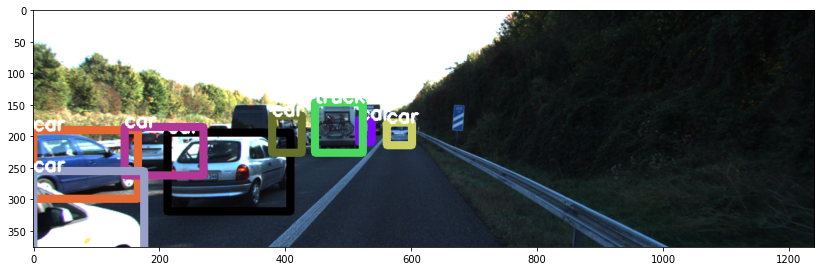

In [62]:
plt.figure(figsize=(14,7))
plt.imshow(draw_boxes_random(pred_bboxes, img))
plt.show()

## Run on a Video

In [69]:
import glob 
from tqdm import tqdm

video_images = sorted(glob.glob("data/*.png"))
result_video = []
for img in tqdm(video_images):
    img = cv2.imread(img)
    _, pred_bboxes = run_obstacle_detection(img)
    img_out = draw_boxes_random(pred_bboxes, img)
    result_video.append(img_out)

 23%|██▎       | 192/837 [00:38<02:08,  5.01it/s]


KeyboardInterrupt: ignored

In [75]:
out = cv2.VideoWriter('out_yolo.mp4',cv2.VideoWriter_fourcc(*'MP4V'), 15, (img.shape[1],img.shape[0]))

for img in result_video:
  out.write(img)
out.release()

In [77]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('out_yolo.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)